## Segmentation model using Detectron2

https://www.makesense.ai/

**Install Detectron2**

In [1]:
# Install pyyaml
!python -m pip install pyyaml==5.1

import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 3.1 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15737, done.
remote: Counting objects: 100% (460/460), done.
remote: Compressing objects: 100% (339/339), done.
remote: Total 15737 (delta 211), reused 305 (delta 112), pack-reused 15277
Receiving objects: 100% (15737/15737), 6.52 MiB | 8.46 MiB/s, done.
Resolving deltas: 100% (11327/11327), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 1.5 MB/s eta 0:00

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [3]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

#Load Dataset

Import the necessary function to register datasets in the COCO format. Let us register both the training and validation datasets. Please note that we are working with training (and validation) data that is is the coco format where we have a single JSON file that describes all the annotations from all training images. <p>
Here, we are naming our training data as 'my_dataset_train' and the validation data as 'my_dataset_val'.



In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
from os import listdir
from os.path import isfile, join
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog

# Definir la ruta a la carpeta que contiene los archivos JSON y las imágenes de entrenamiento
train_folder_path = "/content/drive/MyDrive/DATASET/train"

# Lista para almacenar los nombres de los conjuntos de datos registrados de entrenamiento
train_dataset_names = []

# Función para registrar conjuntos de datos COCO desde la carpeta de entrenamiento
def register_train_dataset(dataset_names, folder_path):
    # Obtener la lista de archivos JSON en la carpeta de entrenamiento
    json_files = [f for f in listdir(folder_path) if isfile(join(folder_path, f)) and f.endswith('.json')]

    # Iterar sobre cada archivo JSON y registrar los conjuntos de datos en Detectron2
    for json_file in json_files:
        dataset_name = f"{folder_path}_{json_file.split('.')[0]}"  # Nombre del conjunto de datos con prefijo de carpeta
        json_path = join(folder_path, json_file)
        image_root = folder_path  # Ruta raíz de las imágenes (ajustar según la estructura de tu nube)

        # Usar el método público 'remove' para anular el registro del conjunto de datos si ya está registrado
        if dataset_name in DatasetCatalog.list():
            DatasetCatalog.remove(dataset_name)
            MetadataCatalog.remove(dataset_name)

        # Registrar el conjunto de datos en Detectron2
        register_coco_instances(dataset_name, {}, json_path, image_root)
        dataset_names.append(dataset_name)

        print(f"Registrado conjunto de datos de entrenamiento '{dataset_name}' desde '{json_path}'")

# Registrar el conjunto de datos de entrenamiento
register_train_dataset(train_dataset_names, train_folder_path)

# Acceder a los metadatos y los diccionarios de conjuntos de datos de entrenamiento registrados
for dataset_name in train_dataset_names:
    train_metadata = MetadataCatalog.get(dataset_name)
    DatasetCatalog.get(dataset_name)
    train_dataset_dicts = DatasetCatalog.get(dataset_name)
    print(f"Metadatos para '{dataset_name}': {train_metadata}")
    print(f"Datos de conjunto para '{dataset_name}': {len(train_dataset_dicts)} ejemplos")


Registrado conjunto de datos de entrenamiento '/content/drive/MyDrive/DATASET/train_test_label' desde '/content/drive/MyDrive/DATASET/train/test_label.json'
Registrado conjunto de datos de entrenamiento '/content/drive/MyDrive/DATASET/train_labels_my-project-name_2024-07-04-08-20-59' desde '/content/drive/MyDrive/DATASET/train/labels_my-project-name_2024-07-04-08-20-59.json'
Registrado conjunto de datos de entrenamiento '/content/drive/MyDrive/DATASET/train_labels_rock_detection_2024-07-04-10-17-02' desde '/content/drive/MyDrive/DATASET/train/labels_rock_detection_2024-07-04-10-17-02.json'
[07/09 17:06:56 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/DATASET/train/test_label.json
[07/09 17:06:56 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/DATASET/train/test_label.json
Metadatos para '/content/drive/MyDrive/DATASET/train_test_label': Metadata(name='/content/drive/MyDrive/DATASET/train_test_label', json_file='/co

Let us extract the metadata and dataset dictionaries for both training and validation datasets. These can be used later for other purposes, like visualization, model training, evaluation, etc. We will see a visualization example right away.

In [7]:


# Definir la ruta a la carpeta que contiene los archivos JSON y las imágenes de validación
val_folder_path = "/content/drive/MyDrive/DATASET/val"

# Lista para almacenar los nombres de los conjuntos de datos registrados de validación
val_dataset_names = []

# Función para registrar conjuntos de datos COCO desde la carpeta de validación
def register_val_dataset(dataset_names, folder_path):
    # Obtener la lista de archivos JSON en la carpeta de validación
    json_files = [f for f in listdir(folder_path) if isfile(join(folder_path, f)) and f.endswith('.json')]

    # Iterar sobre cada archivo JSON y registrar los conjuntos de datos en Detectron2
    for json_file in json_files:
        dataset_name_val = f"{folder_path}_{json_file.split('.')[0]}"  # Nombre del conjunto de datos con prefijo de carpeta
        json_path = join(folder_path, json_file)
        image_root = folder_path  # Ruta raíz de las imágenes (ajustar según la estructura de tu nube)

        # Usar el método público 'remove' para anular el registro del conjunto de datos si ya está registrado
        if dataset_name_val in DatasetCatalog.list():
            DatasetCatalog.remove(dataset_name_val)
            MetadataCatalog.remove(dataset_name_val)

        # Registrar el conjunto de datos en Detectron2
        register_coco_instances(dataset_name_val, {}, json_path, image_root)
        dataset_names.append(dataset_name_val)

        print(f"Registrado conjunto de datos de validación '{dataset_name_val}' desde '{json_path}'")

# Registrar el conjunto de datos de validación
register_val_dataset(val_dataset_names, val_folder_path)

# Acceder a los metadatos y los diccionarios de conjuntos de datos de validación registrados
for dataset_name_val in val_dataset_names:
    val_metadata = MetadataCatalog.get(dataset_name_val)
    DatasetCatalog.get(dataset_name_val)
    val_dataset_dicts = DatasetCatalog.get(dataset_name_val)
    print(f"Metadatos para '{dataset_name_val}': {val_metadata}")
    print(f"Datos de conjunto para '{dataset_name_val}': {len(val_dataset_dicts)} ejemplos")


Registrado conjunto de datos de validación '/content/drive/MyDrive/DATASET/val_val_label' desde '/content/drive/MyDrive/DATASET/val/val_label.json'
Registrado conjunto de datos de validación '/content/drive/MyDrive/DATASET/val_labels_my-project-name_2024-07-03-11-34-40' desde '/content/drive/MyDrive/DATASET/val/labels_my-project-name_2024-07-03-11-34-40.json'
[07/09 17:07:10 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/DATASET/val/val_label.json
[07/09 17:07:10 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/MyDrive/DATASET/val/val_label.json
Metadatos para '/content/drive/MyDrive/DATASET/val_val_label': Metadata(name='/content/drive/MyDrive/DATASET/val_val_label', json_file='/content/drive/MyDrive/DATASET/val/val_label.json', image_root='/content/drive/MyDrive/DATASET/val', evaluator_type='coco', thing_classes=['roca', 'suelo', 'vegetacion', 'background'], thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2, 4: 3})
Datos

# Data Division

In [8]:
from matplotlib import pyplot as plt

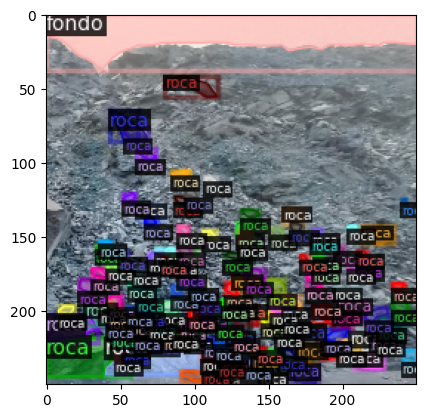

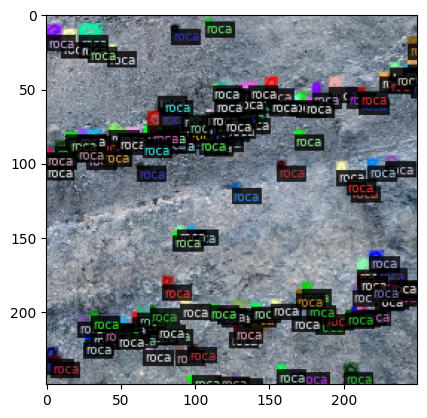

In [9]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

# Model Configuration

Now we are ready to train a Mask R-CNN model using the Detectron2 library. We start by setting up a configuration file (.cfg) for the model. The configuration file contains many details including the output directory path, training dataset information, pre-trained weights, base learning rate, maximum number of iterations, etc.

In [10]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/ENTRENADOS"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = (dataset_name)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 400    # 1000 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # We have 4 classes.
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available


[07/09 17:08:45 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 165MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


# Model Training

In [11]:
trainer.train() #Start the training process

[07/09 17:08:53 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[07/09 17:09:07 d2.utils.events]:  eta: 0:02:49  iter: 19  total_loss: 8.69  loss_cls: 1.593  loss_box_reg: 0.4862  loss_mask: 0.6935  loss_rpn_cls: 5.352  loss_rpn_loc: 0.5187    time: 0.4545  last_time: 0.4534  data_time: 0.0543  last_data_time: 0.0271   lr: 1.2113e-05  max_mem: 2043M
[07/09 17:09:20 d2.utils.events]:  eta: 0:02:35  iter: 39  total_loss: 3.879  loss_cls: 1.425  loss_box_reg: 0.4277  loss_mask: 0.6852  loss_rpn_cls: 0.9156  loss_rpn_loc: 0.4596    time: 0.4366  last_time: 0.4878  data_time: 0.0109  last_data_time: 0.0175   lr: 2.4601e-05  max_mem: 2043M
[07/09 17:09:28 d2.utils.events]:  eta: 0:02:24  iter: 59  total_loss: 2.902  loss_cls: 1.039  loss_box_reg: 0.3592  loss_mask: 0.6712  loss_rpn_cls: 0.4246  loss_rpn_loc: 0.4116    time: 0.4296  last_time: 0.3645  data_time: 0.0136  last_data_time: 0.0063   lr: 3.7088e-05  max_mem: 2045M
[07/09 17:09:36 d2.utils.events]:  eta: 0:02:16  iter: 79  total_loss: 2.556  loss_cls: 0.7254  loss_box_reg: 0.3837  loss_mask: 0.6

In [12]:
import tensorflow as tf # Import TensorFlow to use its functions

Save the config file, for potential future use

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/ENTRENADOS

<IPython.core.display.Javascript object>

In [14]:
import yaml
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/ENTRENADOS/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

# Evaluation of the trained model

In [15]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[07/09 17:13:20 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/ENTRENADOS/model_final.pth ...


Verify segmentation on random validation images

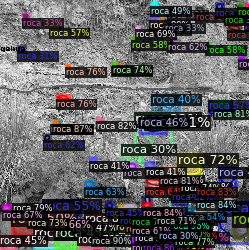

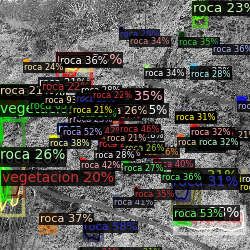

In [16]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(val_dataset_dicts, 2):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Check average precision and recall. (Need more validation data than just 2 images with handful of annotations)

In [17]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator(dataset_name_val, output_dir="./output")
val_loader = build_detection_test_loader(cfg, dataset_name_val)
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[07/09 17:13:36 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[07/09 17:13:36 d2.data.datasets.coco]: Loaded 3 images in COCO format from /content/drive/MyDrive/DATASET/val/labels_my-project-name_2024-07-03-11-34-40.json
[07/09 17:13:36 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    roca    | 95           | vegetacion | 14           |   fondo    | 0            |
|            |              |            |              |            |              |
|   total    | 109          |            |              |            |              |
[07/09 17:13:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/09 17:13:36 d2.data.common]: Seri

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[07/09 17:13:37 d2.evaluation.evaluator]: Total inference time: 0:00:00.193359 (0.193359 s / iter per device, on 1 devices)
[07/09 17:13:37 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.098035 s / iter per device, on 1 devices)
[07/09 17:13:37 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/09 17:13:37 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[07/09 17:13:37 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.049
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.146
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.021
 Average

**Load a new image and segment it.**

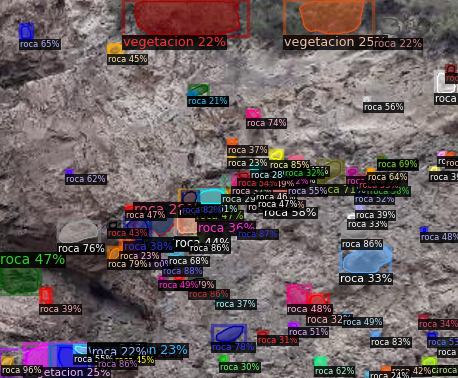

In [19]:
new_im = cv2.imread("/content/drive/MyDrive/IMAGENES/24.png")
outputs  = predictor(new_im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(new_im[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

cv2_imshow(out.get_image()[:, :, ::-1])


# Measurement of percentage volume of rocks

In [20]:
# Calcular el área total de la imagen
total_area = new_im.shape[0] * new_im.shape[1]  # Altura x Ancho

# Calcular el área ocupada por las instancias de roca
instances = outputs["instances"]
areas_roca = []
# Check if 'pred_classes' exists and use it instead of 'prediction_classes'
if hasattr(instances, 'pred_classes'):
    for i in range(len(instances)):
        if train_metadata.thing_classes[instances.pred_classes[i]] == "roca":  # Ajusta la clase según tus datos
            area = instances.pred_boxes.area()[i].item()
            areas_roca.append(area)
else:
    print("Warning: 'pred_classes' not found in Instances object. Check predictor output.")

area_ocupada_roca = sum(areas_roca)

# Calcular el porcentaje de volumen de roca
porcentaje_roca = (area_ocupada_roca / total_area) * 100

# Definir los límites para clasificar las categorías
limite_bajo = 25
limite_alto = 75

# Clasificar según el porcentaje de volumen de roca
if porcentaje_roca < limite_bajo:
    categoria_roca = "matriz"
elif porcentaje_roca >= limite_bajo and porcentaje_roca <= limite_alto:
    categoria_roca = "BIM rock"
else:
    categoria_roca = "macizo rocoso"

# Imprimir el resultado
print(f"Porcentaje de volumen de roca en la imagen: {porcentaje_roca:.2f}%")
print(f"Categoría de roca: {categoria_roca}")



Porcentaje de volumen de roca en la imagen: 16.41%
Categoría de roca: matriz
